In [22]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import pandas_profiling as pdp
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
import json
warnings.simplefilter('ignore')
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 100)

In [23]:
# LOAD DATA
INPUT_DIR  = '../../input/lv9'
LOG_NAME = '06_28_22_43_36'
predicted = np.load(f"../log/{LOG_NAME}/pred_valid.npy") # (70,28)
test = np.load(f"../log/{LOG_NAME}/pred_test.npy")  # (70,28)
json_load = json.load(open(f'../log/{LOG_NAME}/params.json', 'r'))

In [24]:
# load data
sales_array = np.load('../../../input/lv9/sales_array.npy') # (70,1,1936)

# make numeric input
use_days = json_load['use_days']
sales_train_x = sales_array[:, 0, -1 * (28 + use_days) : -28*2]

# fit for train sales
mm = MinMaxScaler(feature_range=(0.05, 0.95))
mm.fit(sales_train_x.T)

# inverse transform
predicted_inv = mm.inverse_transform(predicted.T).T
test_inv = mm.inverse_transform(test.T).T

In [25]:
# check value
print(sales_train_x.max())
print(sales_train_x.min())
print(predicted_inv.max())
print(predicted_inv.min())
print(test_inv.max())
print(test_inv.min())

5118.0
0.0
3978.6191
14.421627
3932.1033
11.796906


# predicted_dfを作る

In [26]:
sales_df = pd.read_csv('../../../input/m5-forecasting-accuracy/sales_train_evaluation.csv')
store_list = sales_df['store_id'].value_counts().index.tolist()
store_list.sort()
dept_list = sales_df['dept_id'].value_counts().index.tolist()
dept_list.sort()

In [27]:
store_index_list=[]
dept_index_list=[]
for store in store_list:
    for dept in dept_list:
        store_index_list.append(store)
        dept_index_list.append(dept)

In [28]:
predicted_df=pd.DataFrame(np.concatenate([predicted_inv,test_inv],axis=1), columns=[f'd_{i+1914}' for i in range(56)])

In [29]:
predicted_df['store_id']=store_index_list
predicted_df['dept_id']=dept_index_list
predicted_df['cat_id']=predicted_df['dept_id'].apply(lambda x: x[:-2])
predicted_df['state_id']=predicted_df['store_id'].apply(lambda x: x[:-2])

In [30]:
predicted_df=predicted_df.loc[:,['dept_id','cat_id','store_id','state_id']+[f'd_{i+1914}' for i in range(56)]]

In [31]:
predicted_df

,dept_id,cat_id,store_id,state_id,d_1914,d_1915,d_1916,d_1917,d_1918,d_1919,d_1920,d_1921,d_1922,d_1923,d_1924,d_1925,d_1926,d_1927,d_1928,d_1929,d_1930,d_1931,d_1932,d_1933,d_1934,d_1935,d_1936,d_1937,d_1938,d_1939,d_1940,d_1941,d_1942,d_1943,d_1944,d_1945,d_1946,d_1947,d_1948,d_1949,d_1950,d_1951,d_1952,d_1953,d_1954,d_1955,d_1956,d_1957,d_1958,d_1959,d_1960,d_1961,d_1962,d_1963,d_1964,d_1965,d_1966,d_1967,d_1968,d_1969
0,FOODS_1,FOODS,CA_1,CA,284.983032,270.601166,272.576324,314.178894,347.443756,349.723877,341.627625,281.734436,253.447235,270.861786,290.560303,355.737457,392.537018,352.108276,266.746399,274.877655,281.107269,280.488922,336.084167,366.946747,373.606232,270.904541,281.641754,302.080414,301.417084,365.860748,404.410065,391.463287,286.071625,279.455170,277.839111,311.745148,332.391968,347.450623,341.489471,290.566864,248.219681,275.888885,294.409241,357.545563,381.679932,367.235779,255.059067,279.811005,273.124786,273.653320,347.651611,364.111603,373.814301,270.210785,283.325745,287.845459,293.579041,365.308899,389.209229,375.047852
1,FOODS_2,FOODS,CA_1,CA,496.756531,455.746979,423.037506,476.240143,537.706116,670.099854,782.976990,597.177551,527.828796,523.314514,500.520203,513.987610,724.101013,787.515076,568.261780,494.473328,445.975647,464.290375,471.728485,564.436401,695.060547,522.354492,475.600555,468.720093,439.696472,497.083069,592.881531,733.882263,480.263794,452.141113,419.751801,457.794891,531.725464,645.552429,750.835571,576.054688,497.649506,502.656525,495.392944,505.647217,694.895691,769.797607,534.009827,485.432953,427.544922,455.226776,482.537903,556.105103,678.961792,502.879486,470.369354,448.230103,434.275513,506.260162,577.433594,696.378296
2,FOODS_3,FOODS,CA_1,CA,2003.146240,1990.167847,1855.012451,2076.846191,2302.717529,2885.325195,3120.749268,2253.642578,2039.049805,2066.496338,2009.783569,2274.669434,2945.112549,3027.369629,2250.307373,1988.104248,1876.986816,1890.608154,2126.929199,2615.610352,2977.076904,2240.578125,2019.245483,2026.860596,1926.835083,2226.098877,2761.687256,2961.089844,1995.202515,2018.713989,1866.229614,2030.688477,2283.158447,2816.949951,3030.723633,2237.476318,1994.636841,2054.364990,2034.646484,2293.972168,2884.204102,3006.652832,2162.215332,2013.711670,1850.571411,1921.836548,2213.210693,2574.931396,2924.282227,2170.480225,2037.987427,1967.935913,1931.017944,2282.172607,2721.843506,2849.611572
3,HOBBIES_1,HOBBIES,CA_1,CA,481.120239,434.174500,425.429230,488.734558,579.691833,608.758179,638.149048,507.573761,436.224609,444.315399,437.918610,528.904907,635.006897,621.536499,484.461792,446.780365,421.864380,450.460724,477.660614,588.487854,634.165100,437.845459,478.364349,458.776642,442.035553,530.451843,609.318665,640.316650,470.201691,440.752411,424.261200,470.568451,552.507812,589.962341,610.126221,499.762177,406.253418,432.465668,435.096619,519.254822,602.760437,623.635864,440.459320,435.491699,397.030426,434.142426,494.910919,560.574890,618.766602,414.530457,469.241119,432.469940,428.971375,536.201233,580.414185,612.979919
4,HOBBIES_2,HOBBIES,CA_1,CA,41.478584,40.672890,42.842392,44.986645,48.004372,51.932835,45.273201,43.735760,29.573101,35.877602,38.939808,41.521675,43.935169,51.013176,33.105404,29.642828,36.862206,38.095261,37.564751,38.459507,57.675198,31.978298,40.512238,39.847820,38.021492,48.227688,50.170269,64.845070,36.799145,37.912186,39.724182,41.123928,45.685394,49.051147,43.939106,40.976307,28.394112,34.109577,37.548000,41.313412,42.391586,49.679562,29.681444,30.104921,33.281574,34.838516,37.938023,38.904858,53.086514,29.506552,37.670258,35.918667,35.793407,46.693394,47.035629,57.768532
5,HOUSEHOLD_1,HOUSEHOLD,CA_1,CA,733.960693,692.006714,671.488708,745.537659,873.098206,1101.204712,1170.306763,817.672729,698.363647,709.491943,694.306091,797.418274,1081.783081,1101.812988,774.956116,670.879761,641.895142,640.818176,735.539124,951.750427,1073.296387,742.818115,725.182678,702.650940,662.054810,793.255188,1005.571289,1131.719849,714.270752,689.3341

In [32]:
pub_cols = [f'd_{i+1914}' for i in range(28)]
pri_cols = [f'd_{i+1942}' for i in range(28)]

# LOSS SUMMARY

In [33]:
group_list = [
[],
['state_id'],
['store_id'],
['cat_id'],
['dept_id'],
['state_id', 'cat_id'],
['state_id', 'dept_id'],
['store_id', 'cat_id'],
['store_id', 'dept_id']
]

for i, group in enumerate(group_list):
    if i == 0:
        pub = predicted_df[pub_cols].values.sum(axis=0)
        target = sales_df[pub_cols].values.sum(axis=0)
        print('lv1 RMSE:',np.sqrt(mean_squared_error(pub, target)))
    else:
        predicted_df.groupby(group).sum()
        pub = predicted_df.groupby(group).sum()[pub_cols].values
        target = sales_df.groupby(group).sum()[pub_cols].values
        print(f'lv{i+1} RMSE:',np.sqrt(mean_squared_error(pub, target)))

lv1 RMSE: 3549.6656982949066
lv2 RMSE: 1437.5937875336042
lv3 RMSE: 535.5690377311001
lv4 RMSE: 1621.58586950265
lv5 RMSE: 803.32520449992
lv6 RMSE: 677.6743597307116
lv7 RMSE: 336.7562690613954
lv8 RMSE: 260.98126536072596
lv9 RMSE: 135.51804684557055


# LB plot

lv1 RMSE: 3630.780276296576


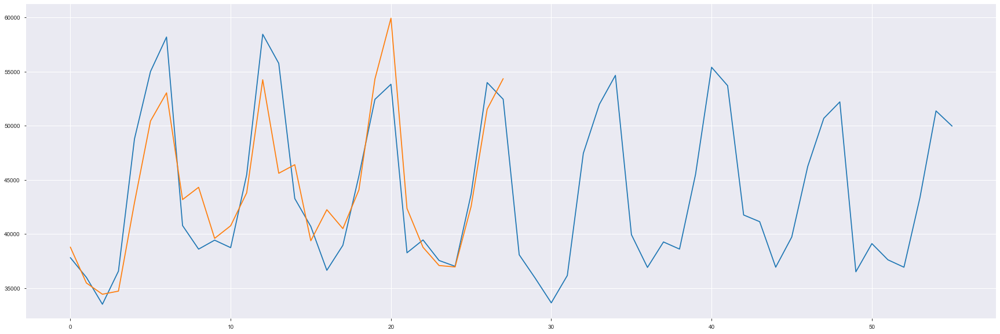

In [13]:
# lv1
pub = predicted_df[pub_cols].values.sum(axis=0)
target = sales_df[pub_cols].values.sum(axis=0)
print('lv1 RMSE:',np.sqrt(mean_squared_error(pub, target)))
f, ax = plt.subplots(figsize=(30, 10))
plt.plot(predicted_df[pub_cols+pri_cols].values.sum(axis=0))
plt.plot(target)
plt.show()

lv2 RMSE: 1435.4562104676704


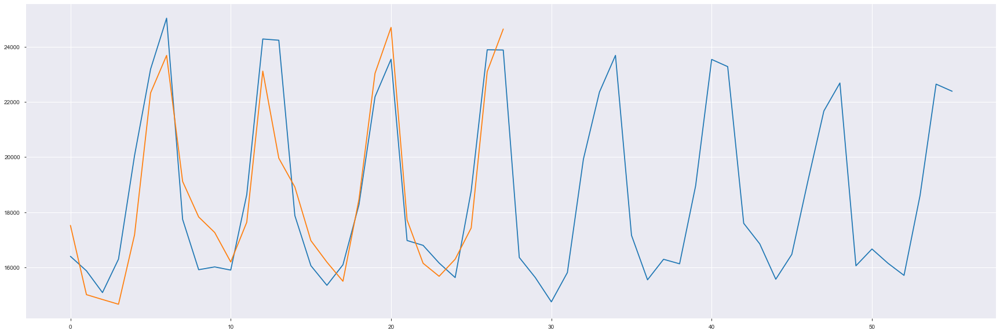

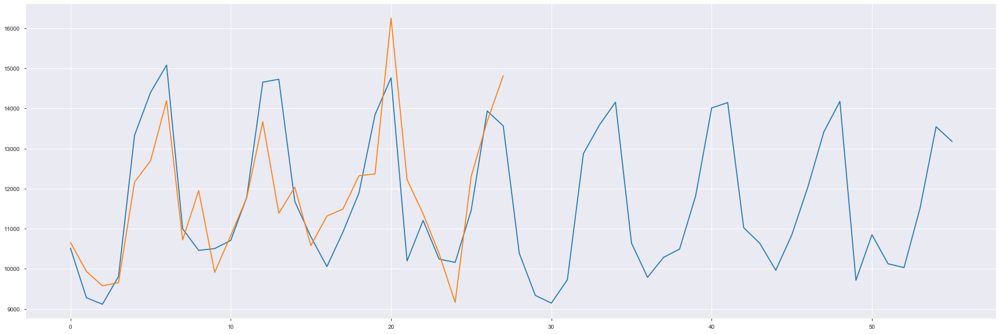

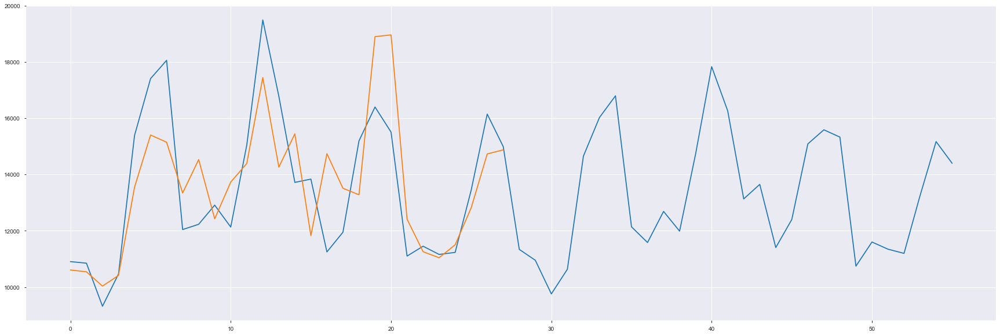

In [14]:
# lv2
group = ['state_id']
predicted_df.groupby(group).sum()

pub = predicted_df.groupby(group).sum()[pub_cols].values
target = sales_df.groupby(group).sum()[pub_cols].values
print('lv2 RMSE:',np.sqrt(mean_squared_error(pub, target)))
for i in range(pub.shape[0]):
    f, ax = plt.subplots(figsize=(30, 10))
    plt.plot(predicted_df.groupby(group).sum()[pub_cols+pri_cols].values[i])
    plt.plot(sales_df.groupby(group).sum()[pub_cols].values[i])
    plt.show()

lv3 RMSE: 537.146354065524


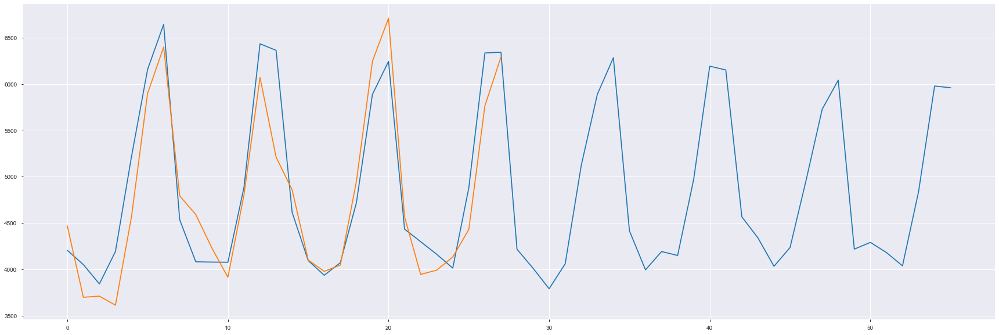

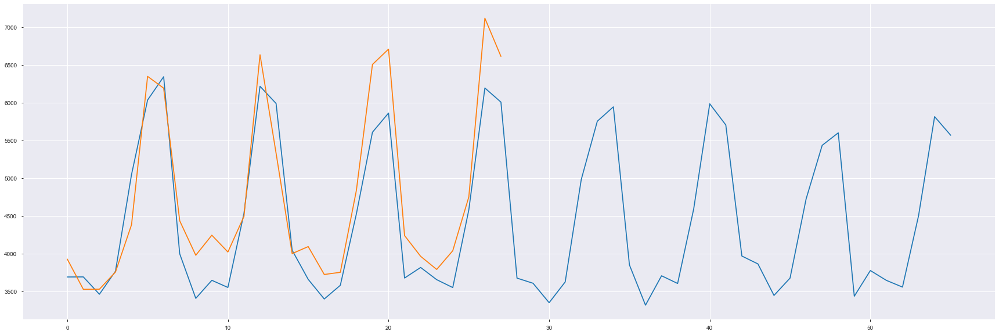

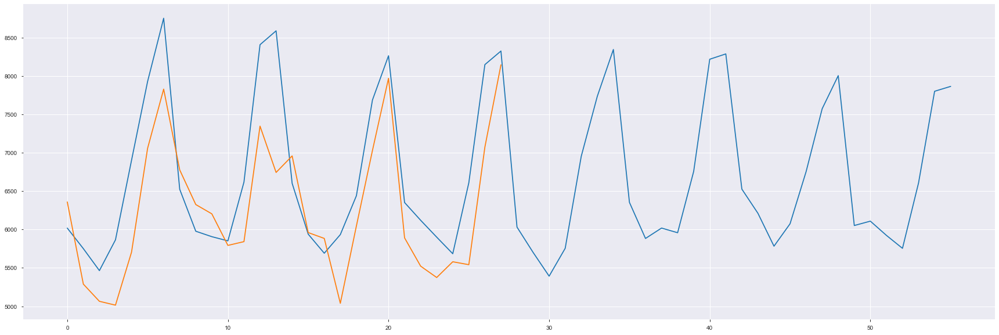

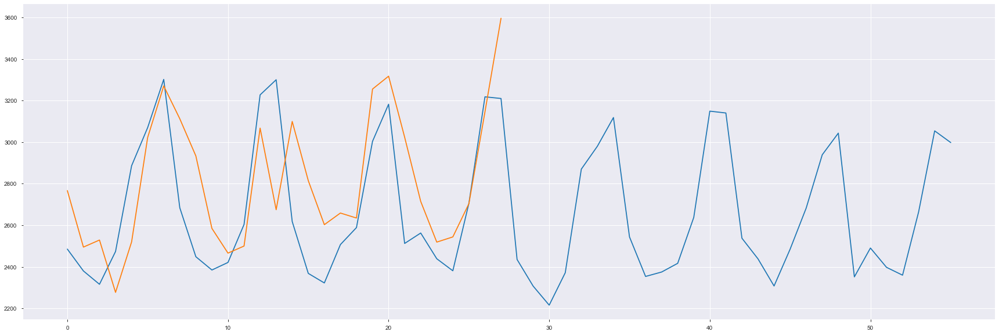

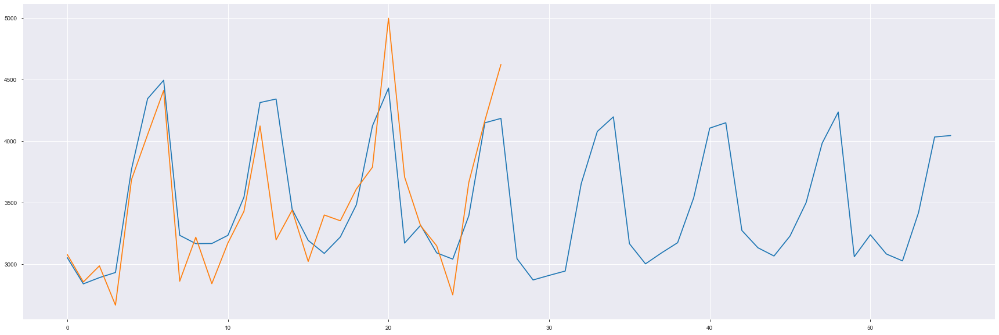

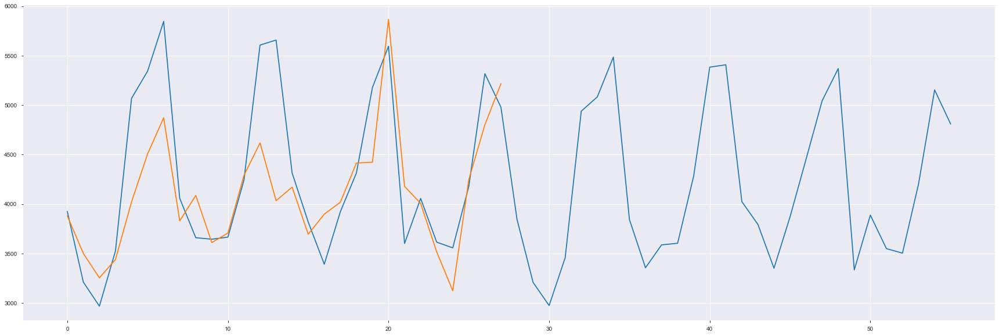

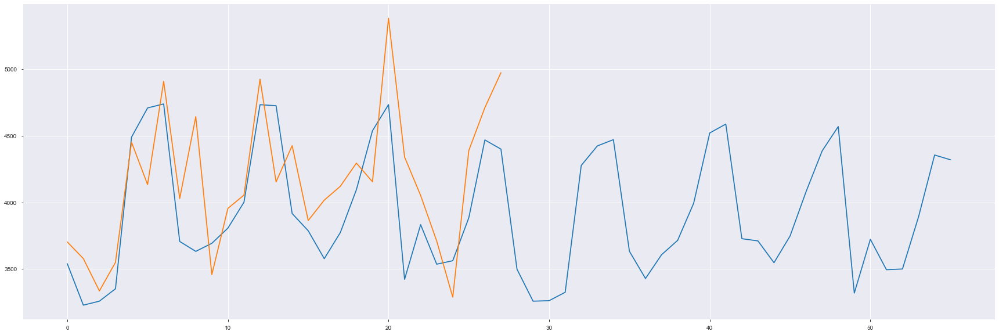

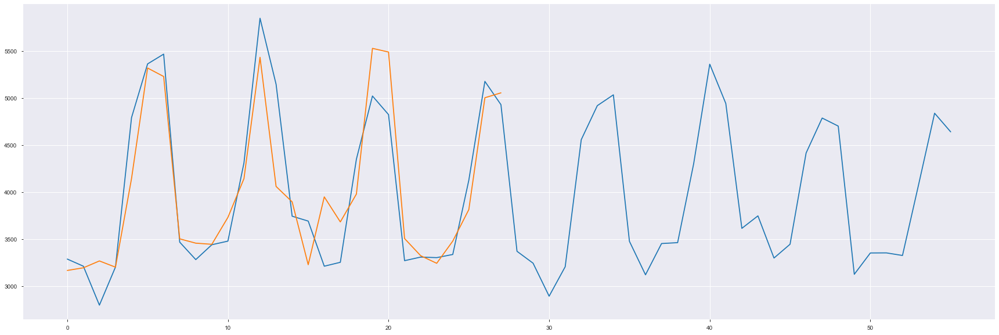

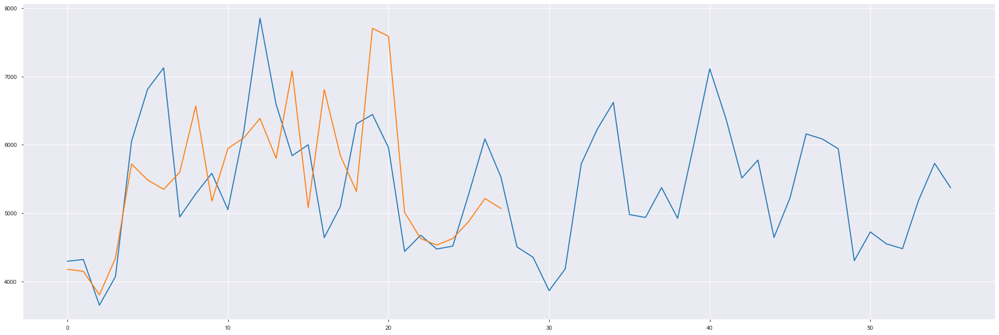

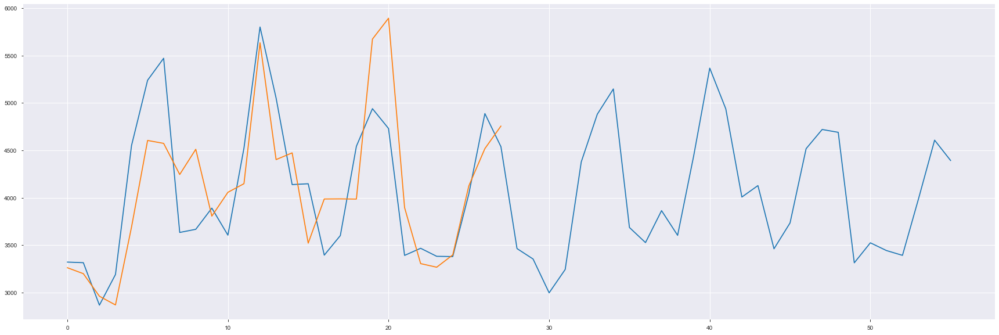

In [15]:
# lv3
group = ['store_id']
predicted_df.groupby(group).sum()

pub = predicted_df.groupby(group).sum()[pub_cols].values
target = sales_df.groupby(group).sum()[pub_cols].values
print('lv3 RMSE:',np.sqrt(mean_squared_error(pub, target)))
for i in range(pub.shape[0]):
    f, ax = plt.subplots(figsize=(30, 10))
    plt.plot(predicted_df.groupby(group).sum()[pub_cols+pri_cols].values[i])
    plt.plot(sales_df.groupby(group).sum()[pub_cols].values[i])
    plt.show()

lv4 RMSE: 1614.6157263116156


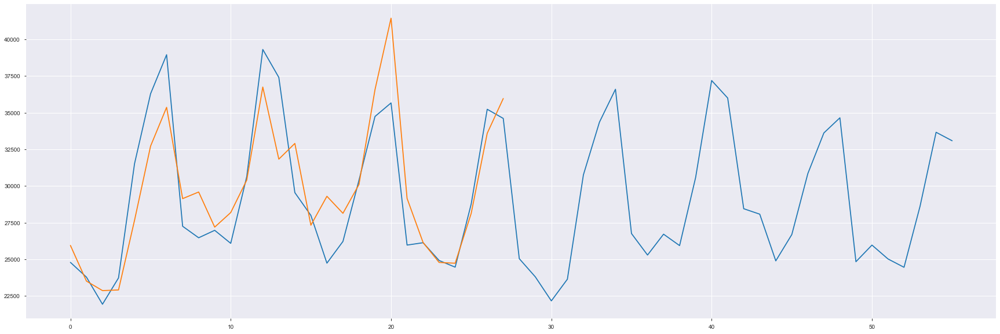

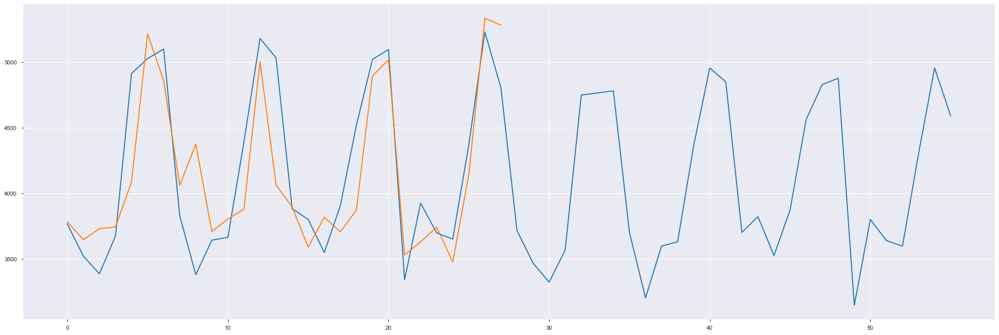

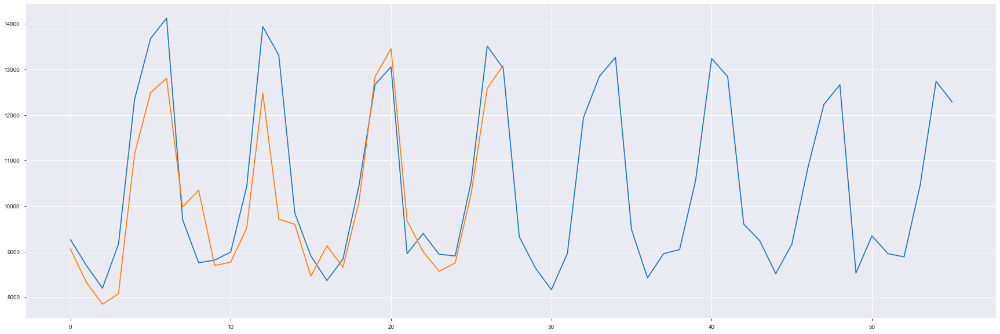

In [16]:
# lv4
group = ['cat_id']
predicted_df.groupby(group).sum()

pub = predicted_df.groupby(group).sum()[pub_cols].values
target = sales_df.groupby(group).sum()[pub_cols].values
print('lv4 RMSE:',np.sqrt(mean_squared_error(pub, target)))
for i in range(pub.shape[0]):
    f, ax = plt.subplots(figsize=(30, 10))
    plt.plot(predicted_df.groupby(group).sum()[pub_cols+pri_cols].values[i])
    plt.plot(sales_df.groupby(group).sum()[pub_cols].values[i])
    plt.show()

lv5 RMSE: 826.1984348576208


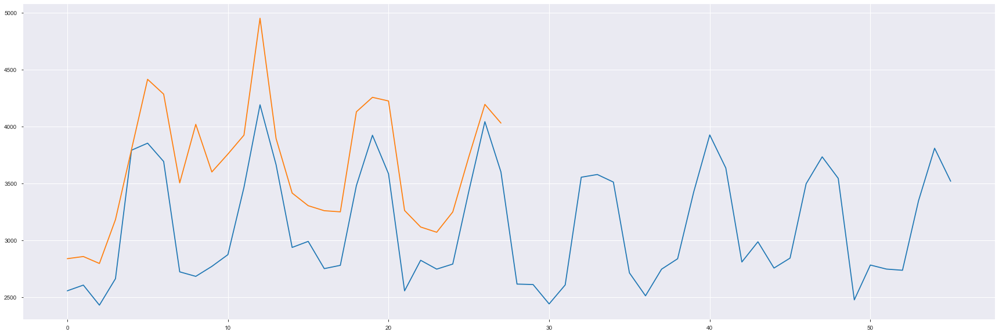

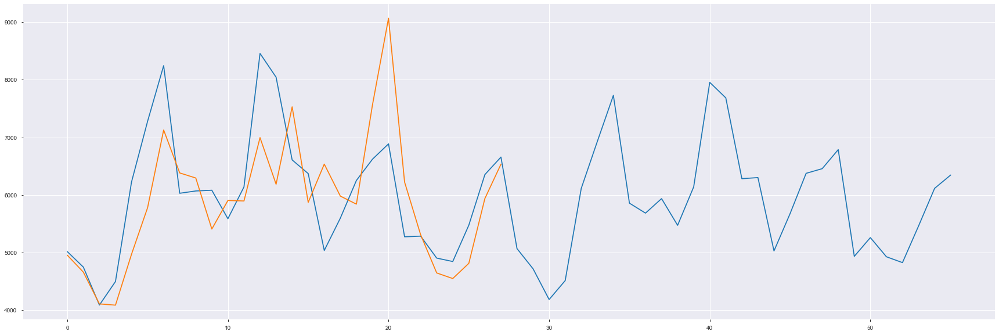

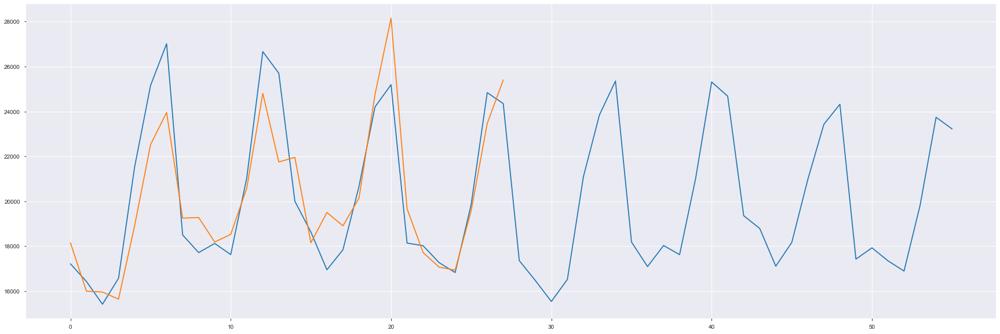

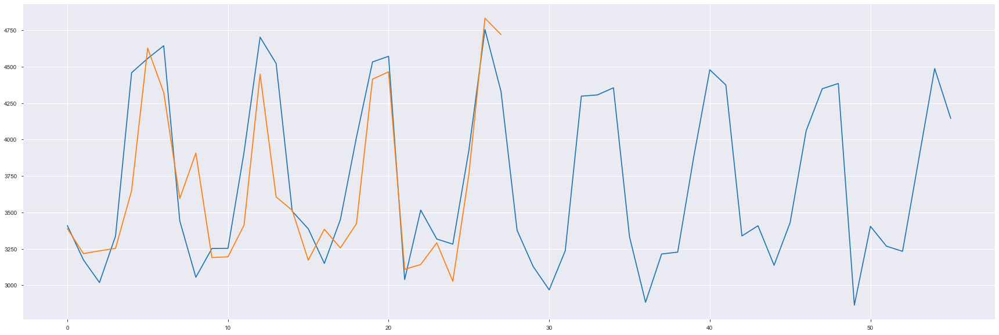

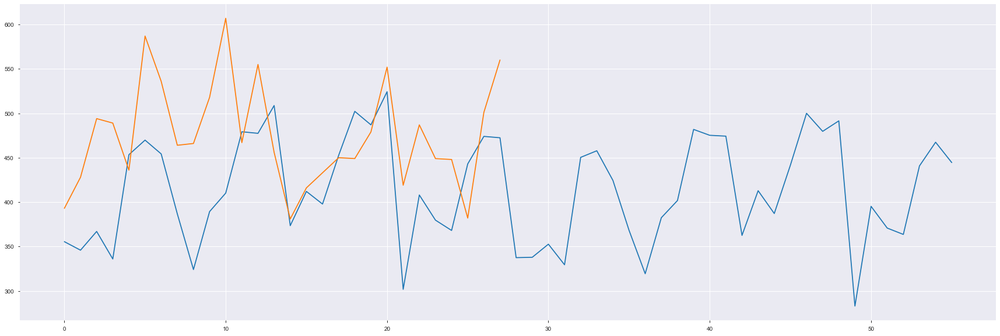

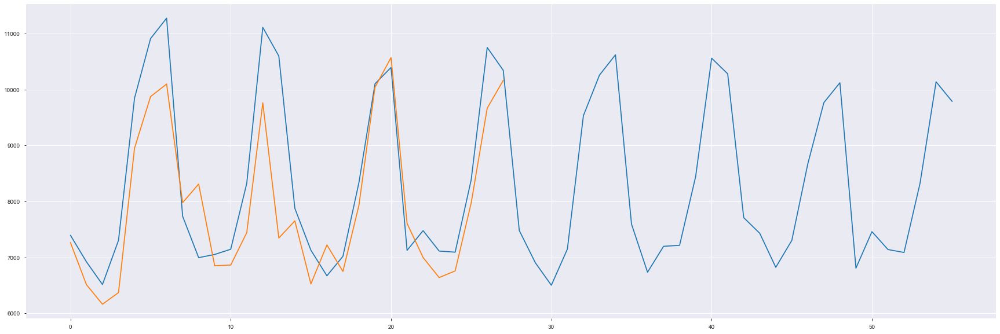

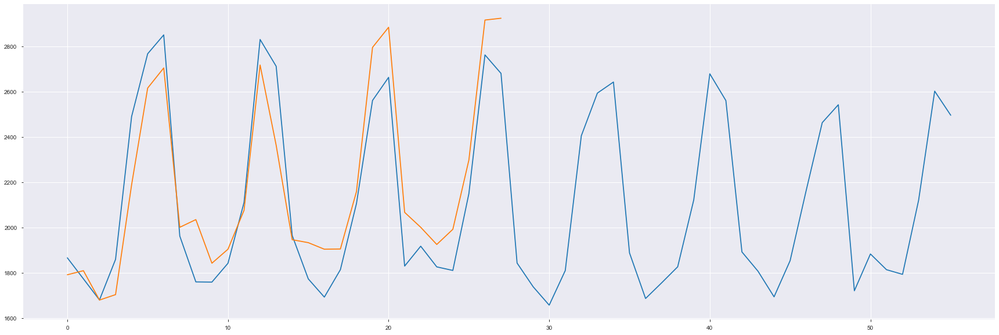

In [17]:
# lv5
group = ['dept_id']
predicted_df.groupby(group).sum()

pub = predicted_df.groupby(group).sum()[pub_cols].values
target = sales_df.groupby(group).sum()[pub_cols].values
print('lv5 RMSE:',np.sqrt(mean_squared_error(pub, target)))
for i in range(pub.shape[0]):
    f, ax = plt.subplots(figsize=(30, 10))
    plt.plot(predicted_df.groupby(group).sum()[pub_cols+pri_cols].values[i])
    plt.plot(sales_df.groupby(group).sum()[pub_cols].values[i])
    plt.show()

lv6 RMSE: 666.7294414975485


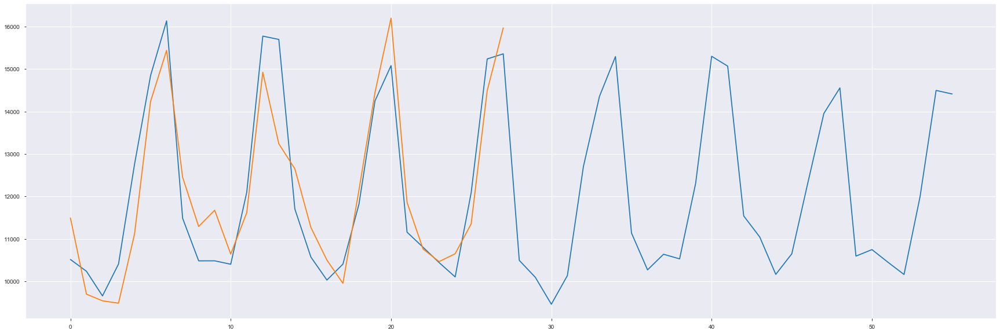

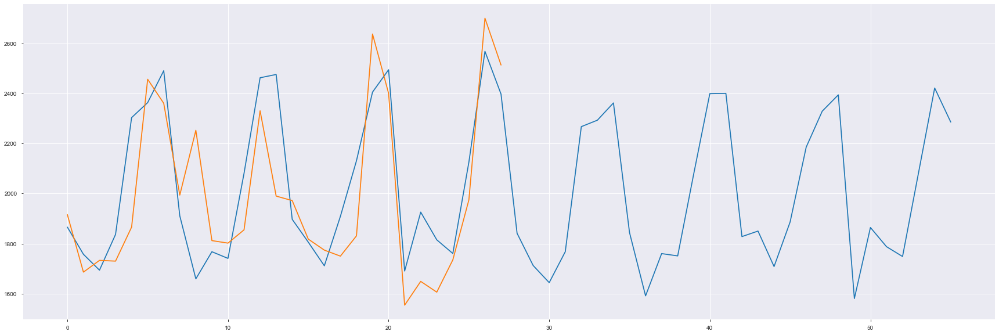

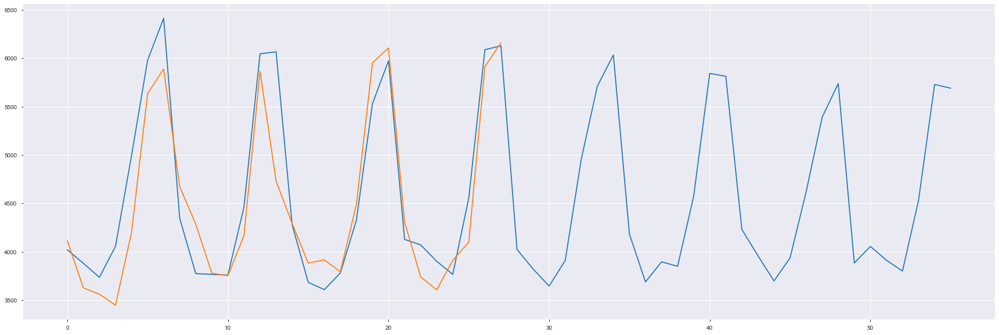

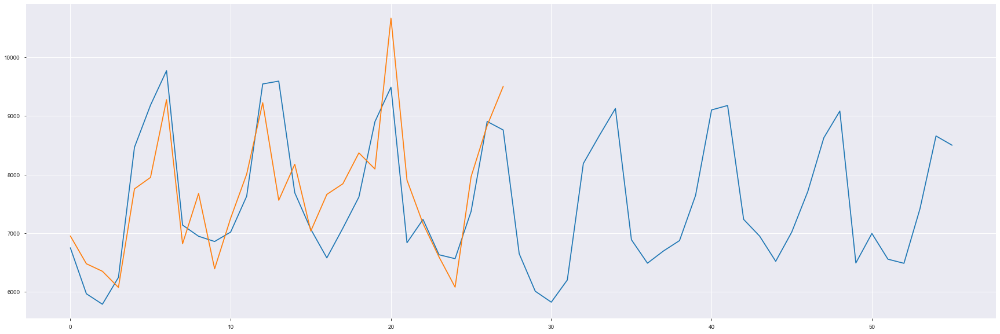

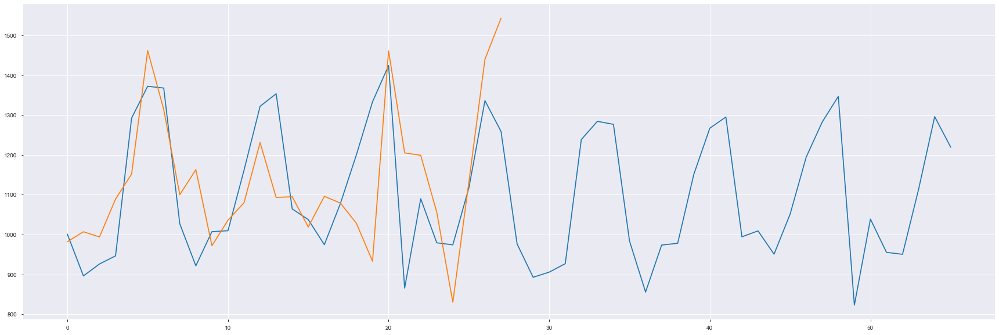

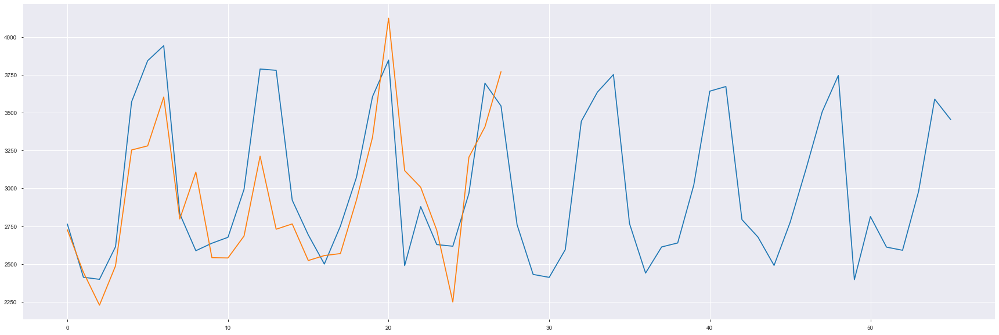

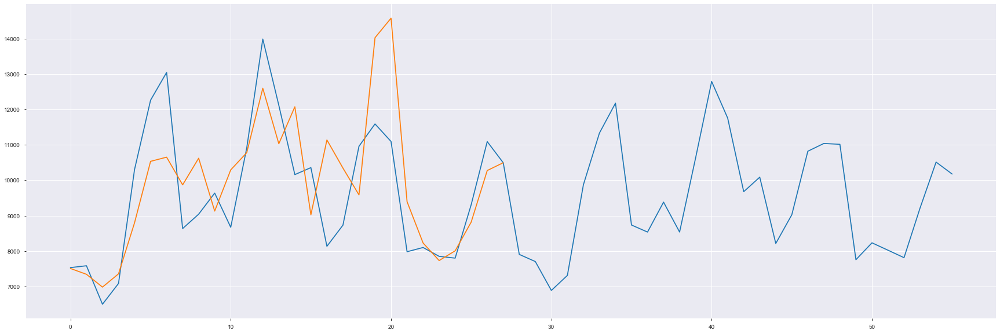

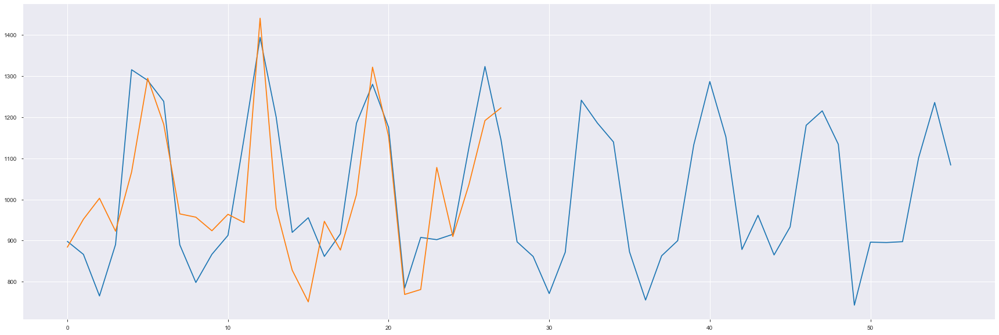

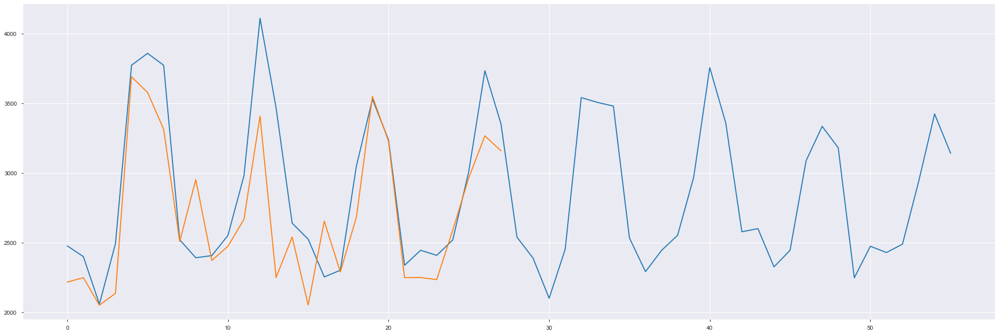

In [18]:
# lv6
group = ['state_id', 'cat_id']
predicted_df.groupby(group).sum()

pub = predicted_df.groupby(group).sum()[pub_cols].values
target = sales_df.groupby(group).sum()[pub_cols].values
print('lv6 RMSE:',np.sqrt(mean_squared_error(pub, target)))
for i in range(pub.shape[0]):
    f, ax = plt.subplots(figsize=(30, 10))
    plt.plot(predicted_df.groupby(group).sum()[pub_cols+pri_cols].values[i])
    plt.plot(sales_df.groupby(group).sum()[pub_cols].values[i])
    plt.show()

lv7 RMSE: 339.0098295607303


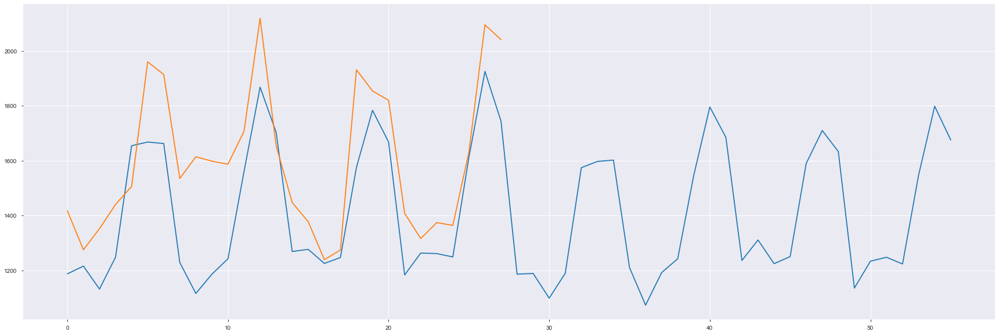

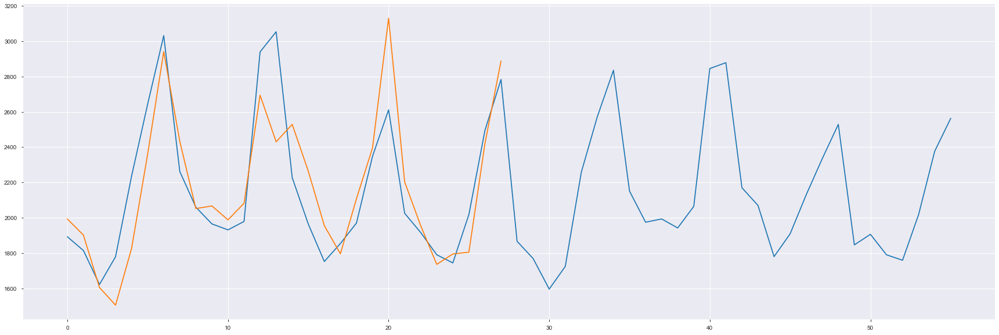

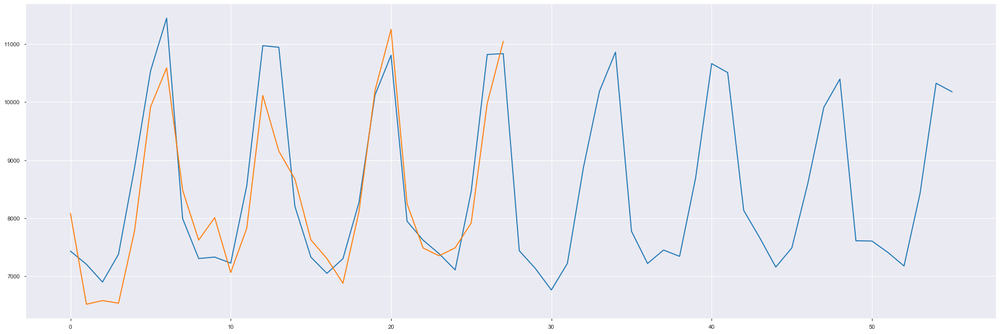

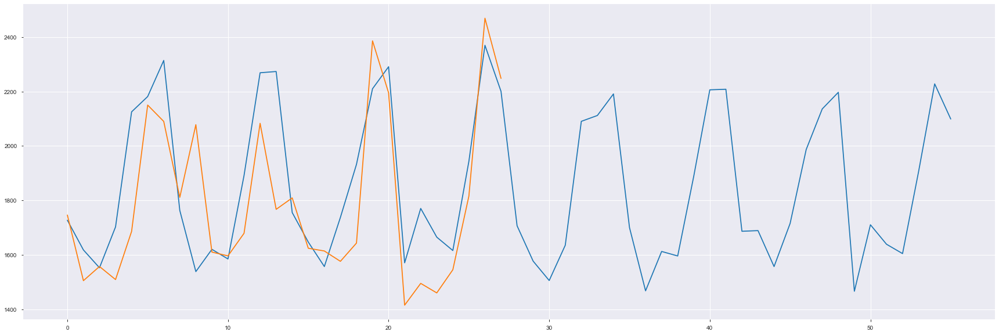

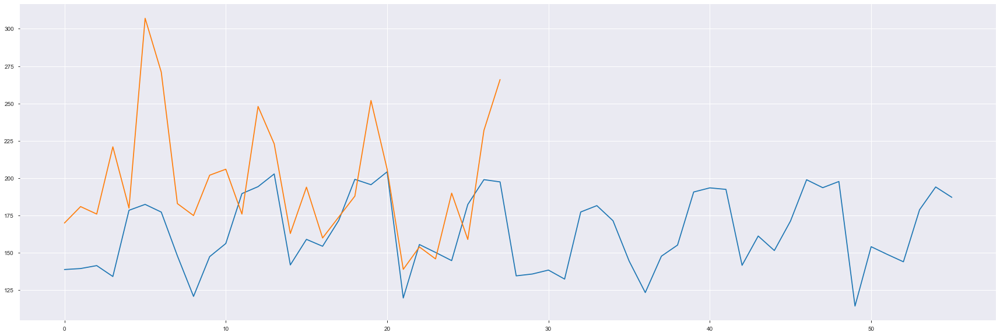

...

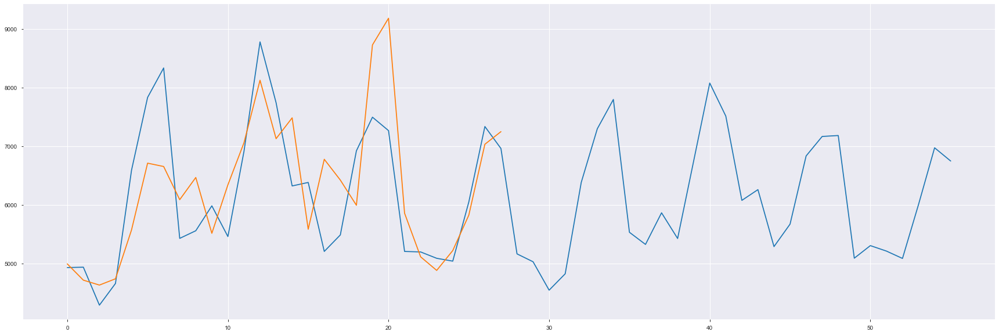

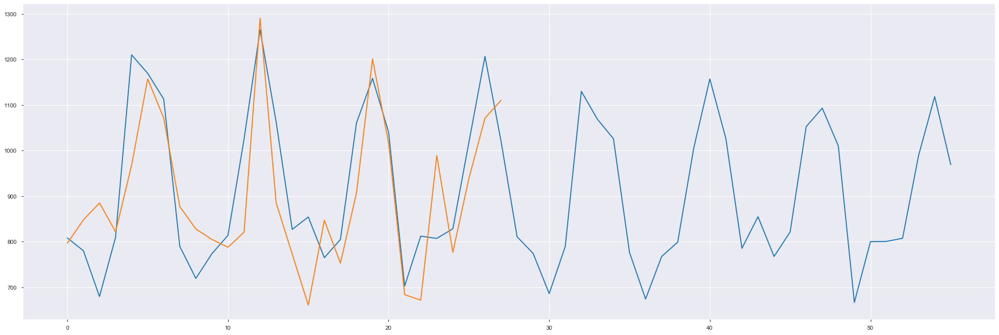

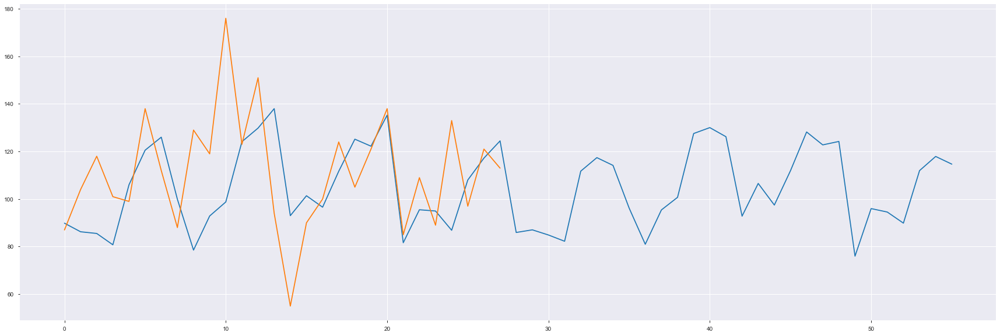

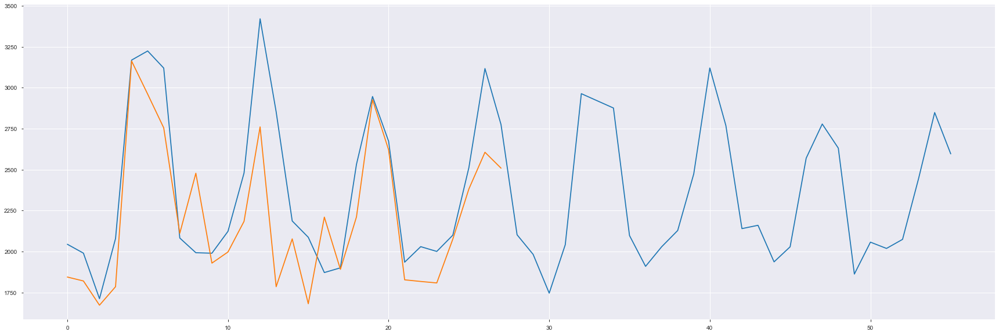

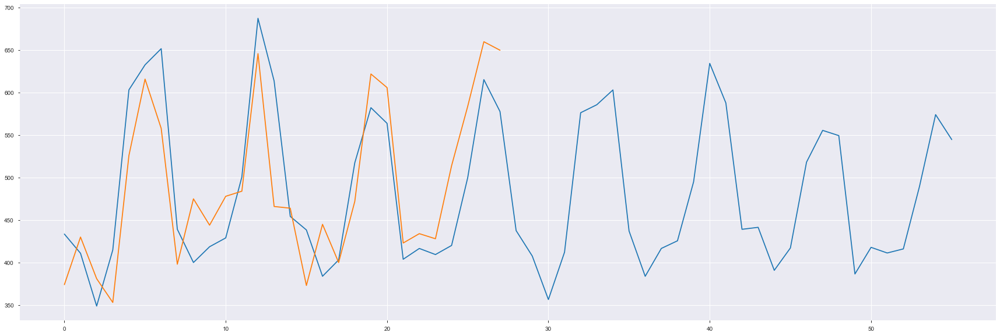

In [19]:
# lv7
group = ['state_id', 'dept_id']
predicted_df.groupby(group).sum()

pub = predicted_df.groupby(group).sum()[pub_cols].values
target = sales_df.groupby(group).sum()[pub_cols].values
print('lv7 RMSE:',np.sqrt(mean_squared_error(pub, target)))
for i in range(pub.shape[0]):
    f, ax = plt.subplots(figsize=(30, 10))
    plt.plot(predicted_df.groupby(group).sum()[pub_cols+pri_cols].values[i])
    plt.plot(sales_df.groupby(group).sum()[pub_cols].values[i])
    plt.show()

lv8 RMSE: 257.59464061104933


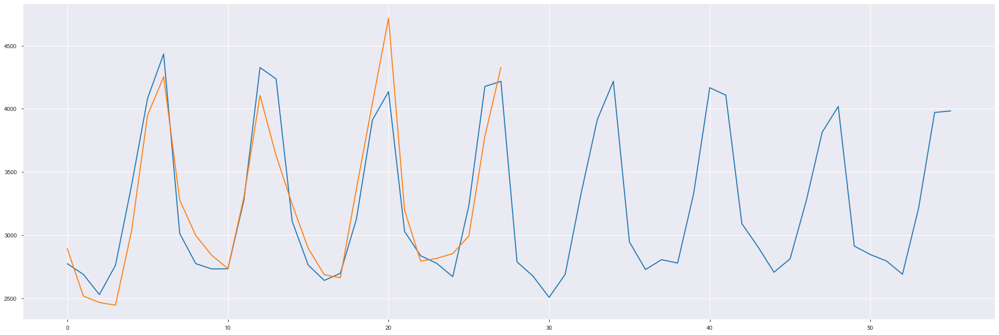

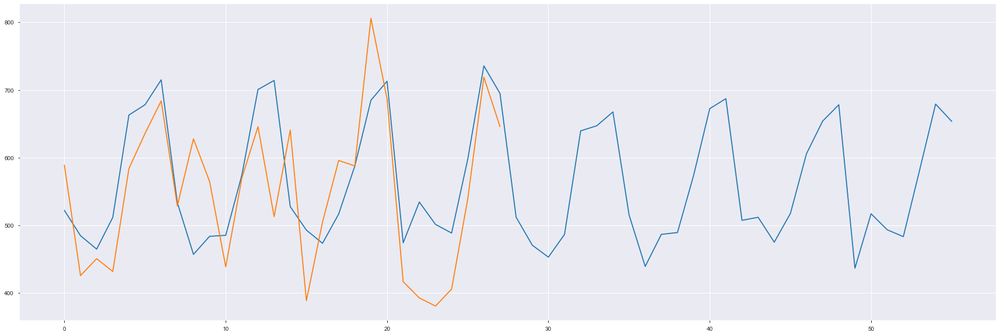

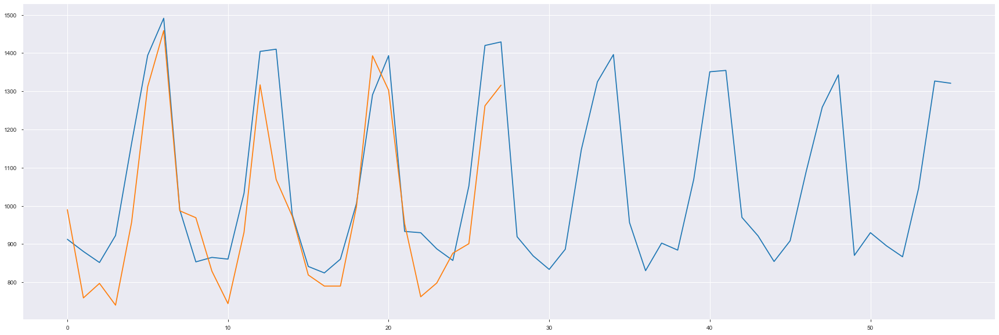

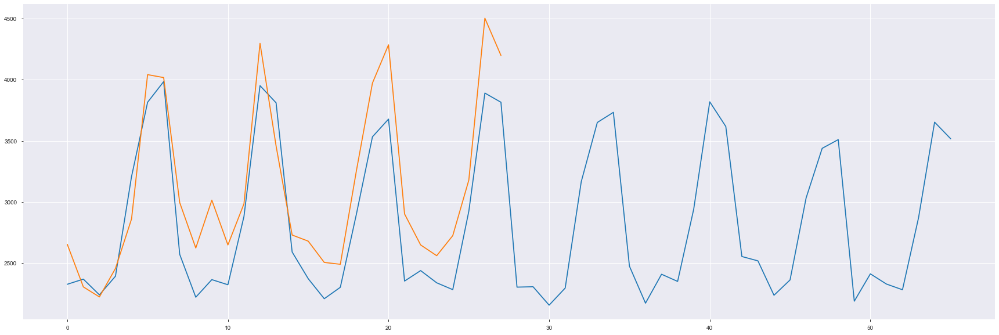

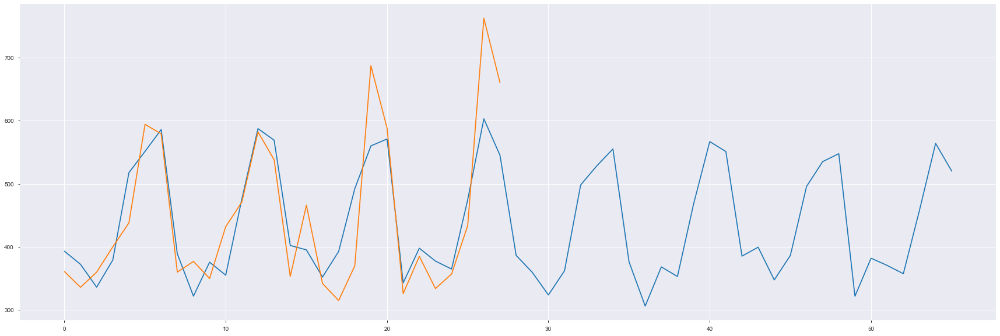

...

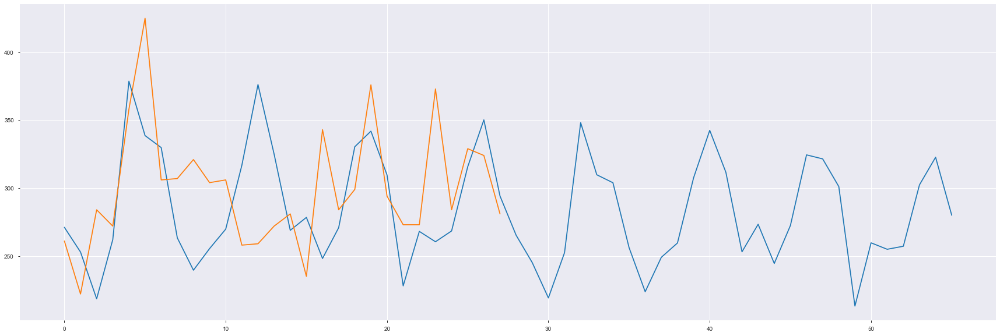

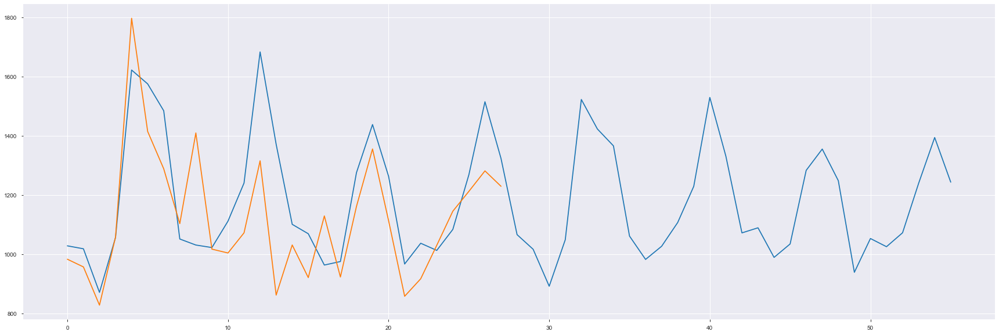

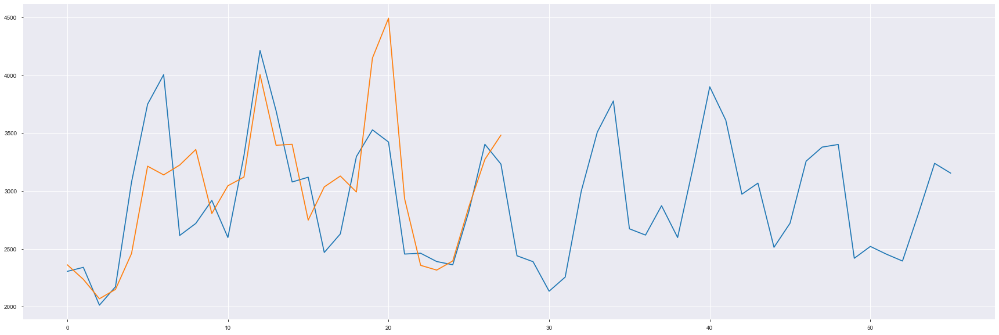

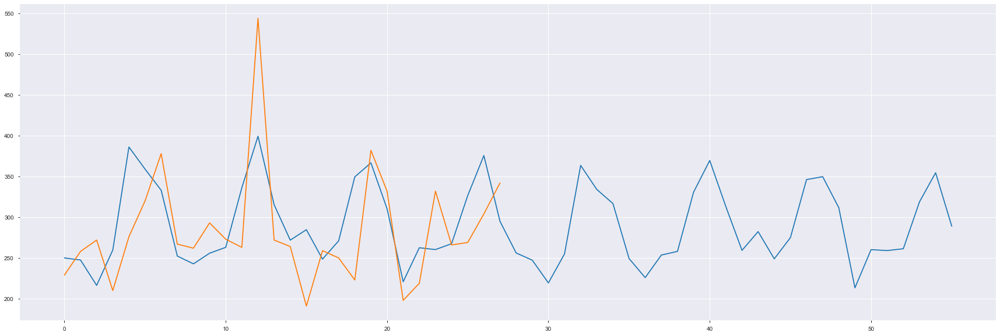

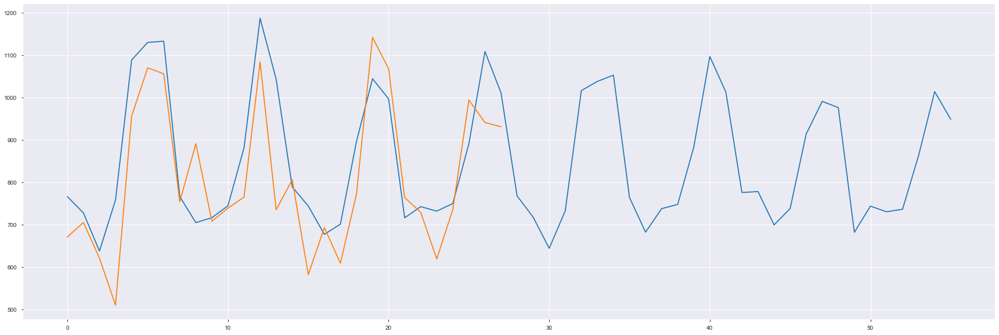

In [20]:
# lv8
group = ['store_id', 'cat_id']
predicted_df.groupby(group).sum()

pub = predicted_df.groupby(group).sum()[pub_cols].values
target = sales_df.groupby(group).sum()[pub_cols].values
print('lv8 RMSE:',np.sqrt(mean_squared_error(pub, target)))
for i in range(pub.shape[0]):
    f, ax = plt.subplots(figsize=(30, 10))
    plt.plot(predicted_df.groupby(group).sum()[pub_cols+pri_cols].values[i])
    plt.plot(sales_df.groupby(group).sum()[pub_cols].values[i])
    plt.show()

lv9 RMSE: 135.98383338504513


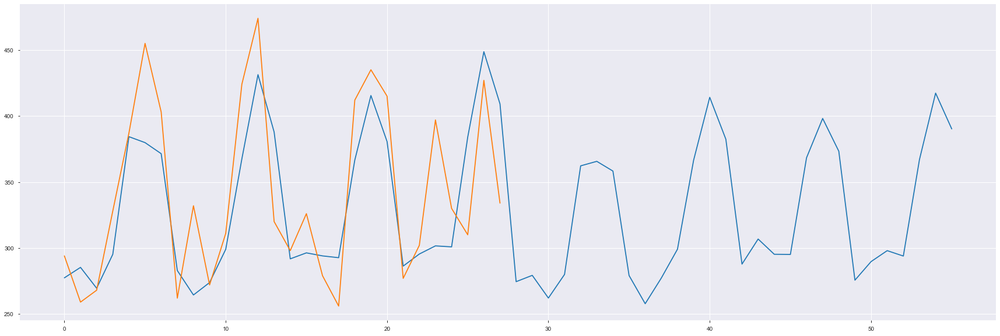

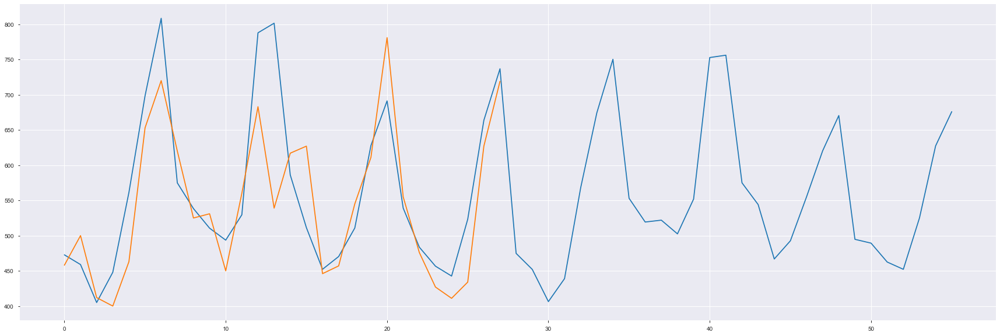

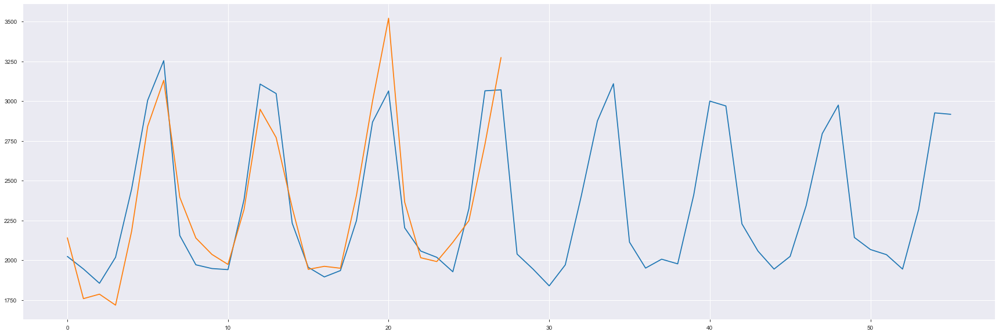

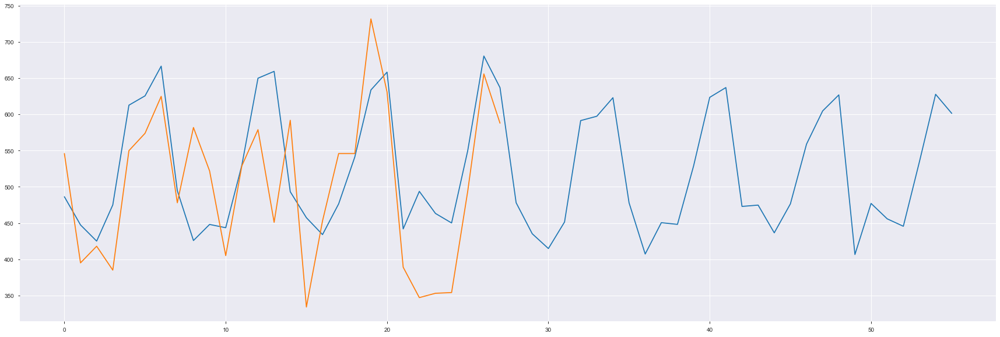

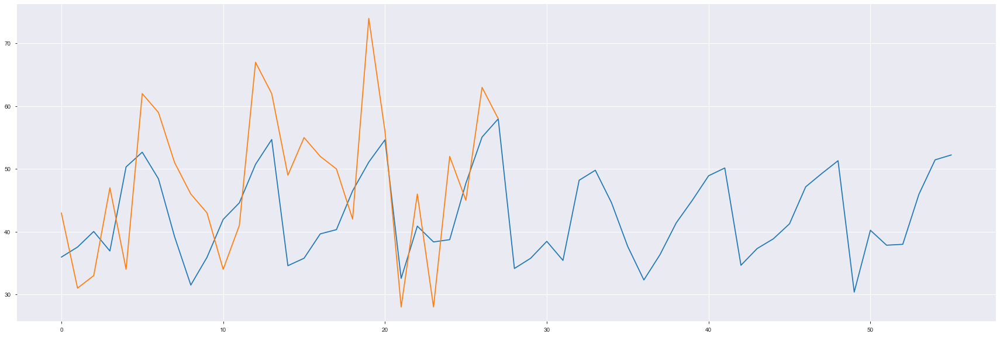

...

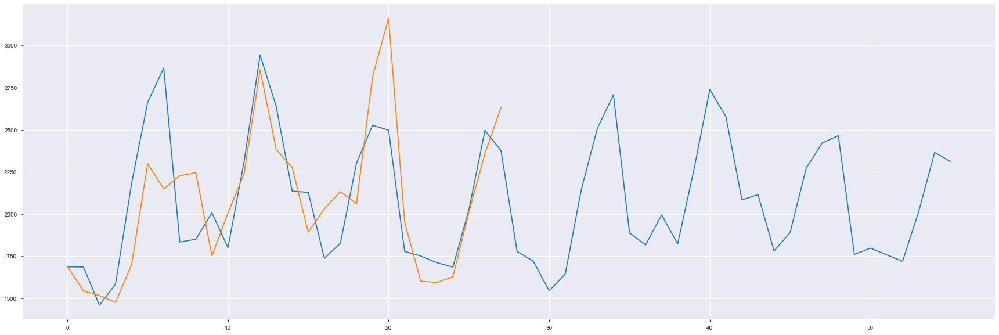

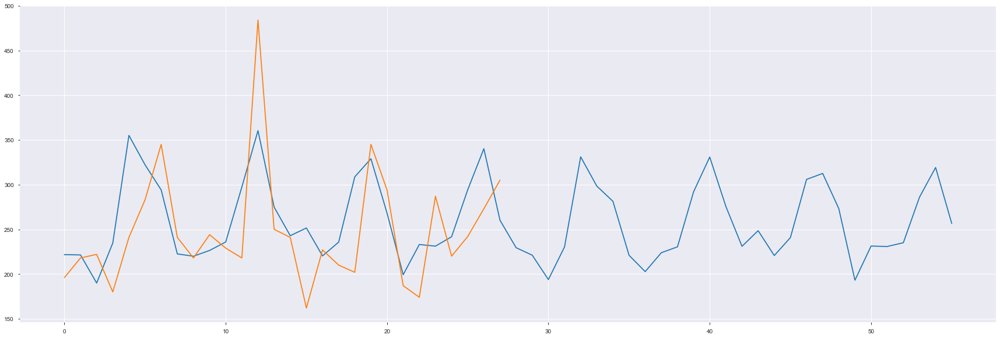

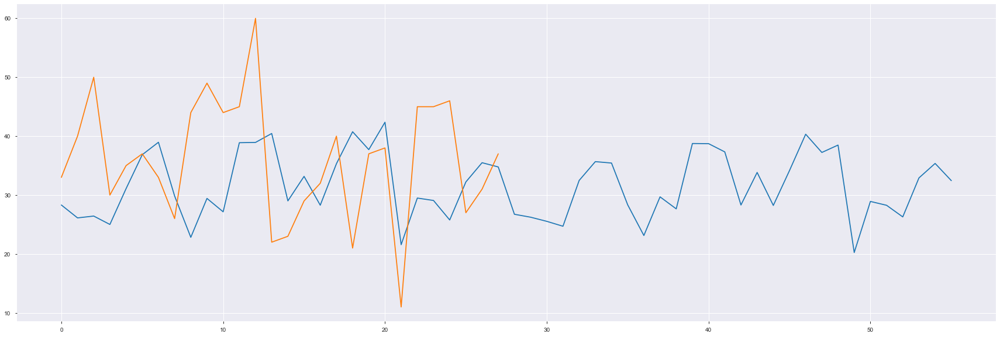

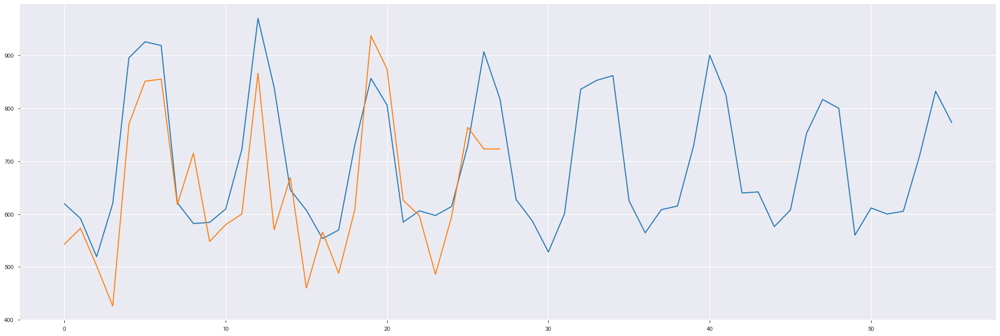

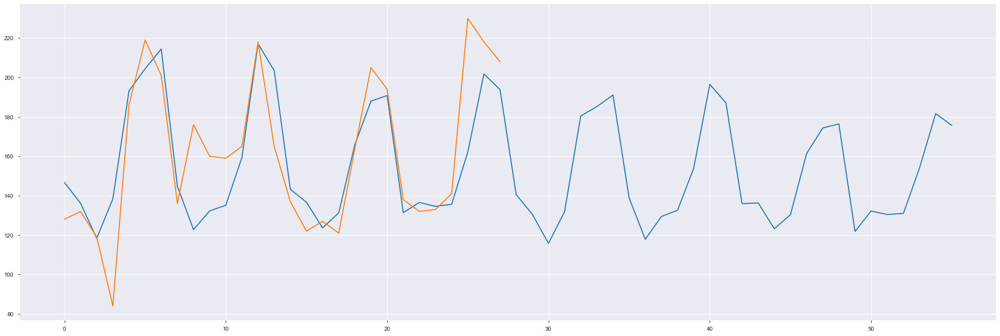

In [21]:
# lv9
group = ['store_id', 'dept_id']
predicted_df.groupby(group).sum()

pub = predicted_df.groupby(group).sum()[pub_cols].values
target = sales_df.groupby(group).sum()[pub_cols].values
print('lv9 RMSE:',np.sqrt(mean_squared_error(pub, target)))
for i in range(pub.shape[0]):
    f, ax = plt.subplots(figsize=(30, 10))
    plt.plot(predicted_df.groupby(group).sum()[pub_cols+pri_cols].values[i])
    plt.plot(sales_df.groupby(group).sum()[pub_cols].values[i])
    plt.show()